# Visualisatie - Voorbeelden

In dit notebook vind je voorbeelden van visualisaties met:
 - <a href="#matplotlib"> Matplotlib </a>
 - <a href="#holoviews"> HoloViews </a>
 - <a href="#seaborn"> Seaborn </a>

<a id="matplotlib"></a>
## Visualisatie met Matplotlib


Hieronder een samenvatting van de belangrijkste onderdelen van Jake VanderPlas Ch4: Visualization with Matplotlib

Andere bronnen:

- https://matplotlib.org/users/pyplot_tutorial.html
- https://www.datacamp.com/community/tutorials/matplotlib-tutorial-python
- http://pandas.pydata.org/pandas-docs/stable/visualization.html

In [5]:
# zorgen dat plots in het notebook komen
%matplotlib inline

# importeren van de matplotlib
import matplotlib.pyplot as plt

# andere bibliotheken
import numpy as np
import pandas as pd

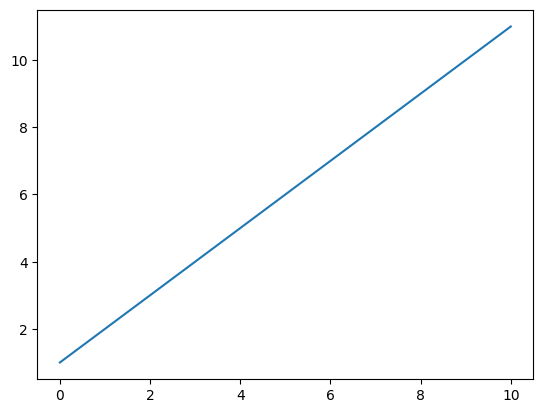

In [6]:
# een eerste voorbeeld
x = np.linspace(0,10,100)   # 100 getallen tussen de 0 en 10
y = x + 1
plt.plot(x,y)
plt.show()

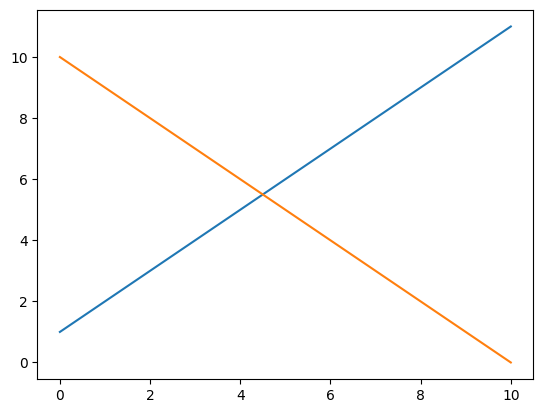

In [7]:
# nu met 2 lijnen
y2 = -x + 10
plt.plot(x,y)
plt.plot(x,y2)
plt.show()

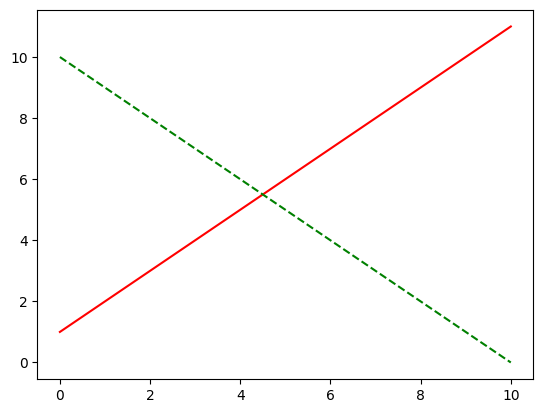

In [8]:
# zelf soort lijn en kleuren bepalen
plt.plot(x,y,color='red', linestyle = '-')  # rode doorlopende lijn
plt.plot(x,y2,color='green', linestyle = '--')  # blauwe gestreepte lijn
plt.show()

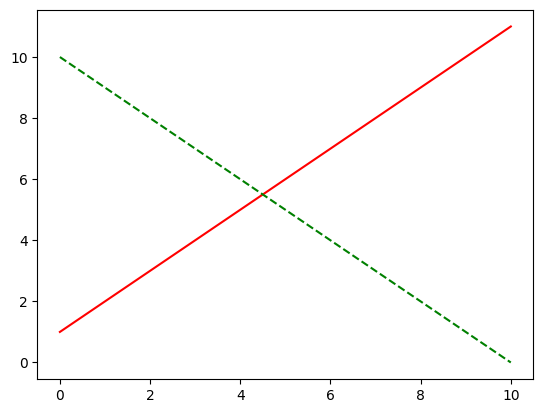

In [9]:
# idem, verkorte schrijfwijze
plt.plot(x,y,'-r')  # rode doorlopende lijn
plt.plot(x,y2,'--g')  # blauwe gestreepte lijn
plt.show()

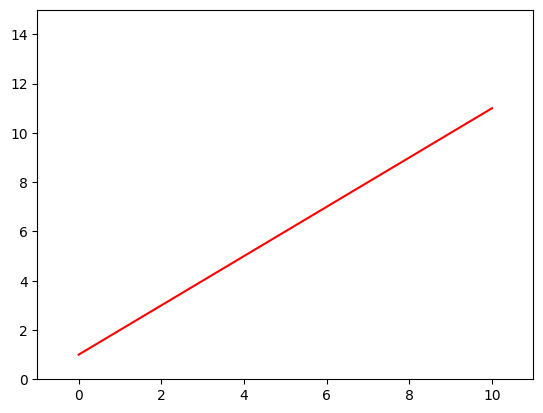

In [10]:
# assen indelen
plt.xlim(-1,11)
plt.ylim(0,15)
plt.plot(x,y,'-r')  # rode doorlopende lijn
plt.show()

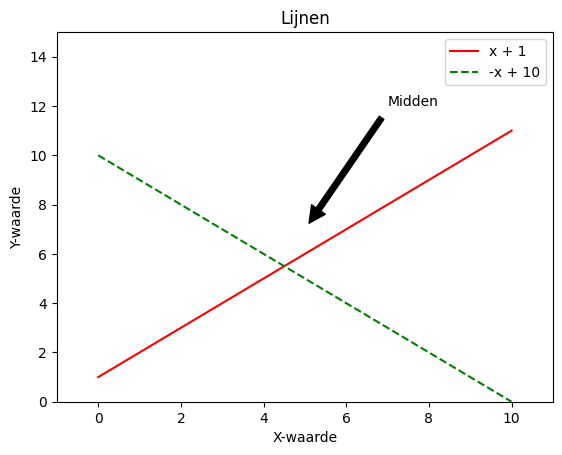

In [11]:
# toewijzen Labels
plt.xlim(-1,11)
plt.ylim(0,15)

plt.plot(x,y,'-r', label='x + 1')  # rode doorlopende lijn
plt.plot(x,y2,'--g', label='-x + 10')  # blauwe gestreepte lijn

# Titel boven de grafiek:
plt.title('Lijnen')
# X-as label
plt.xlabel('X-waarde')
# Y-as label
plt.ylabel('Y-waarde')
# afdrukken legenda
plt.legend()

# annotatie
plt.annotate('Midden', xy=(5,7),xytext=(7,12), arrowprops=dict(facecolor='black',shrink=0.05))

plt.show()

In [12]:
import matplotlib.pylab as pylab

params = {'axes.labelsize': 'xx-large',
          'xtick.labelsize': 'xx-large',
          'ytick.labelsize': 'xx-large'}
 
pylab.rcParams.update(params)

Text(7, 12, 'Midden')

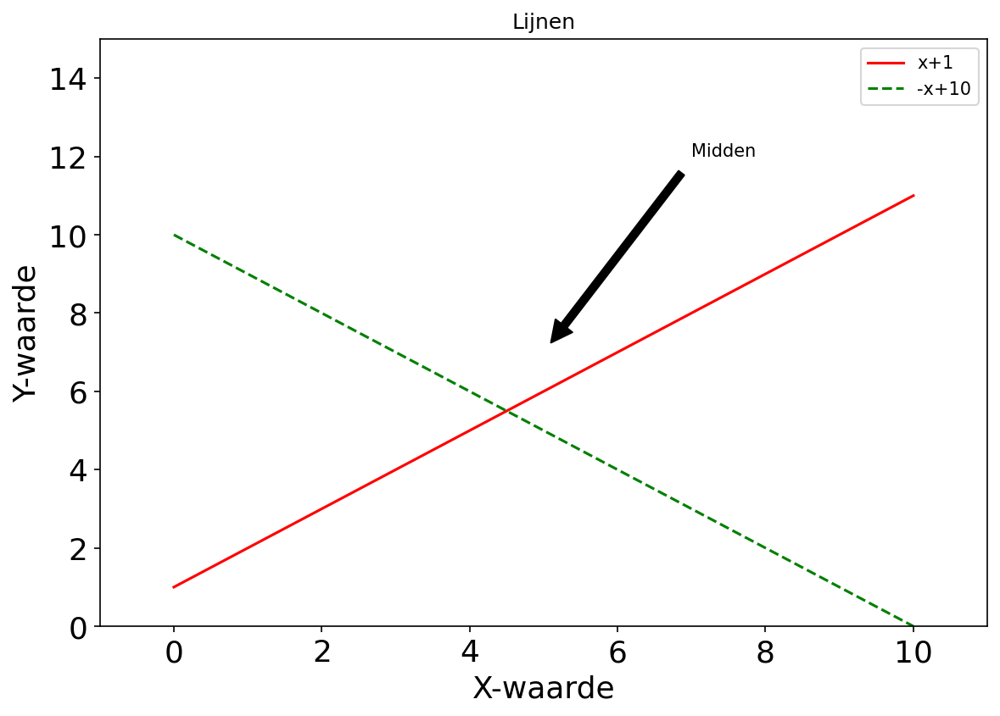

In [13]:
# De OO-interface

# Hierboven wordt de standaard matplotlib functies gebruikt. 
# Maar Matplotlib kan ook meer OO-gericht aangestuurd worden.

# object figure: container voor alle grafische objecten
fig = plt.figure(figsize=(9,6), dpi=150)

# object axes: de grafiekbasis
ax = plt.axes()

ax.set(xlim=(-1,11),
       ylim=(0,15),
       xlabel='X-waarde',
       ylabel='Y-waarde',
       title='Lijnen')

ax.plot(x,y,'-r')
ax.plot(x,y2,'--g')

ax.legend(['x+1','-x+10'])
ax.annotate('Midden', xy=(5,7),xytext=(7,12), arrowprops=dict(facecolor='black',shrink=0.05))

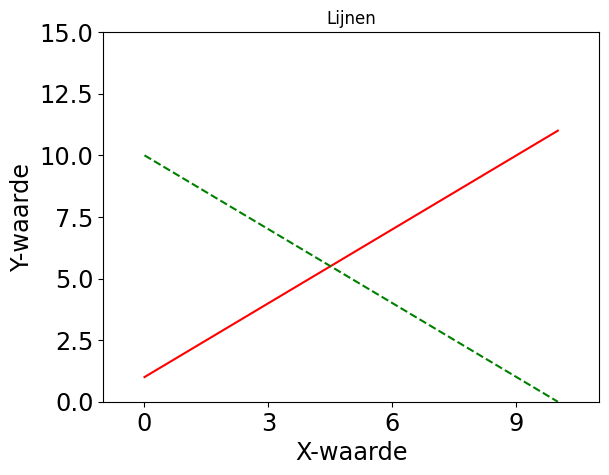

In [14]:
# Variaties in ticks (as-gegevens) (OO interface)
fig = plt.figure()
ax = plt.axes()
ax.set(xlim=(-1,11),
       ylim=(0,15),
       xlabel='X-waarde',
       ylabel='Y-waarde',
       title='Lijnen')

# beperk X-as tot 4 punten:
ax.xaxis.set_major_locator(plt.MaxNLocator(4))

ax.plot(x,y,'-r')
ax.plot(x,y2,'--g')


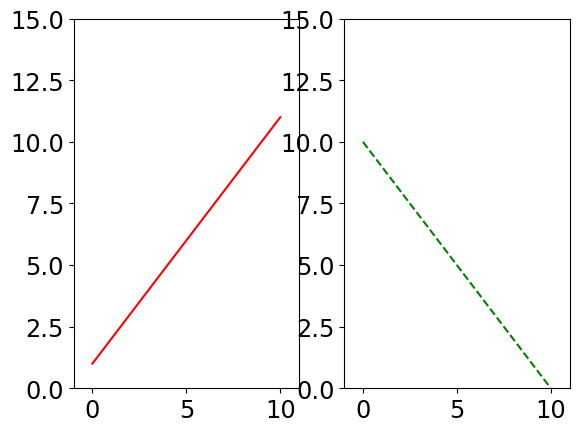

In [15]:
# Subplots (standaard interface)

plt.subplot(1,2,1)  # 1 rij, 2 kolommen, kolom 1
plt.xlim(-1,11)
plt.ylim(0,15)
plt.plot(x,y,'-r')  # rode doorlopende lijn

plt.subplot(1,2,2)  # 1 rij, 2 kolommen, kolom 1
plt.xlim(-1,11)
plt.ylim(0,15)
plt.plot(x,y2,'--g')  # groene gestreepte lijn

plt.show()

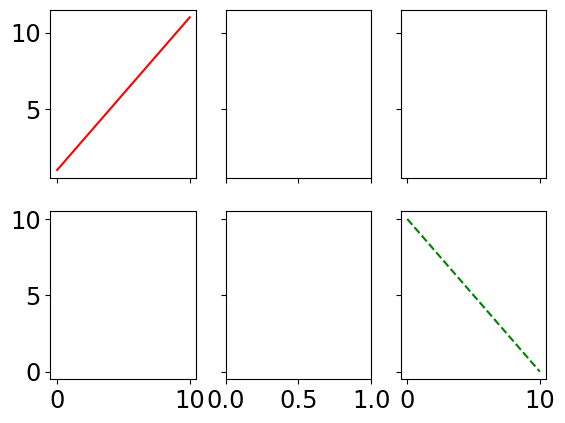

In [16]:
# subplots (OO-interface)

# 2 rijen 3 kolommen
fig, ax = plt.subplots(2,3,sharex='col', sharey='row')

# plt.subplots: 0-based array

# 1e rij, kolom 1
ax[0,0].plot(x,y,'-r')

# 2e rij, kolom 3
ax[1,2].plot(x,y2,'--g')

## Andere grafieken

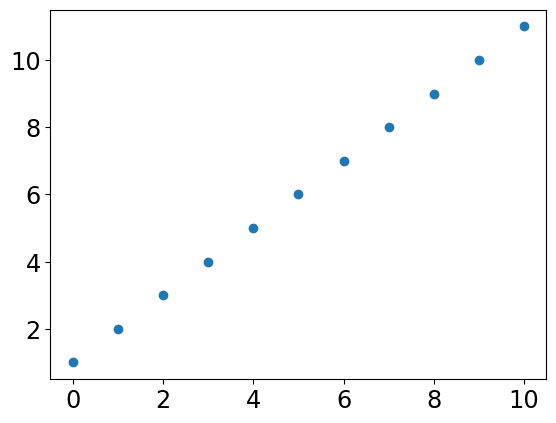

In [17]:
# Scatter grafiek
xs = np.linspace(0,10,11)   # 11 getallen tussen de 0 en 10

ys = xs + 1
plt.scatter(xs,ys,marker='o')   # marker kent heel veel instellingsmogelijkheden

In [18]:
# Errorbar grafiek, met seaborn opmaak
plt.style.use('seaborn-white')
xe = np.linspace(0,10,11)   # 10 getallen
ye = xe * xe    # kwadrateren
dy = ye * 0.2   # error: +/-20% van de berekende waarde
plt.errorbar(xe, ye, yerr=dy, fmt='.k')
plt.show()

OSError: 'seaborn-white' is not a valid package style, path of style file, URL of style file, or library style name (library styles are listed in `style.available`)

In [ ]:
# Histogram, verdeling van de waarden

yh = np.random.randn(1000)   # 1000 getallen rond de 0, die normaal verdeeld zijn
plt.hist(yh,bins=9)          # histogram van 9 'balken'
plt.show()

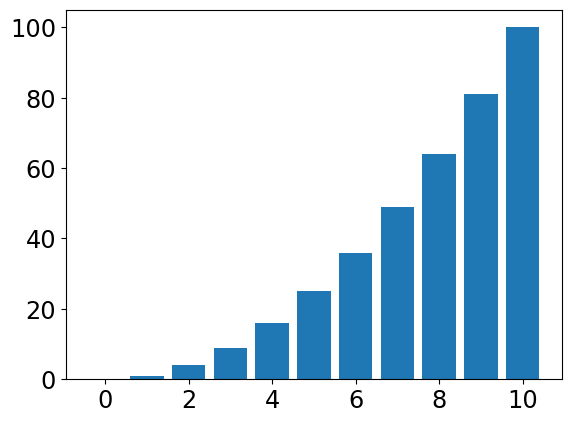

In [19]:
# Bar chart
xb = np.linspace(0,10,11)   # 10 getallen
yb = xb * xb    # kwadrateren
plt.bar(xb,yb)
plt.show()

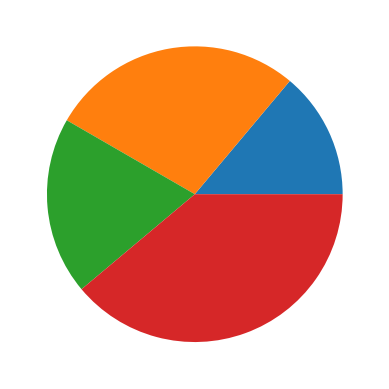

In [20]:
# Pie chart
yp = np.array([25,50,35,70])
plt.pie(yp)
plt.show()

<a id="holoviews"></a>
## HoloViews


### Why HoloViews?

HoloViews is an [open-source](https://github.com/ioam/holoviews/) Python 2 and 3 library for data analysis and visualization. Python already has excellent tools like numpy, pandas, and xarray for data processing, and bokeh and matplotlib for plotting, so why yet another library?

**HoloViews helps you understand your data better, by letting you work seamlessly with both the data *and* its graphical representation.**

HoloViews focuses on bundling your data together with the appropriate metadata to support both analysis and visualization, making your raw data *and* its visualization equally accessible at all times.  This process can be unfamiliar to those used to traditional data-processing and plotting tools, and this getting-started guide is meant to demonstrate how it all works at a high level.  More detailed information about each topic is then provided in the [User Guide](../user_guide/).

With HoloViews, instead of building a plot using direct calls to a plotting library, you first describe your data with a small amount of crucial semantic information required to make it visualizable, then you specify additional metadata as needed to determine more detailed aspects of your visualization. This approach provides immediate, automatic visualization that can be effortlessly requested at any time as your data evolves, rendered automatically by one of the supported plotting libraries (such as Bokeh or Matplotlib). 


### Tabulated data: subway stations

To illustrate how this process works, we will demonstrate some of the key features of HoloViews using a collection of datasets related to transportation in New York City. First let's run some imports to make [numpy](http://numpy.org) and [pandas](http://pandas.pydata.org) accessible for loading the data. Here we start with a table of subway station information loaded from a CSV file with pandas:

<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W
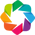

In [19]:
import pandas as pd
import numpy as np
import holoviews as hv
hv.extension('bokeh')

This is the standard way to make the numpy and pandas libraries available in the namespace. We recommend always importing HoloViews as ``hv`` and if you haven't already installed HoloViews, check out the install instructions on our [homepage](www.holoviews.org).

Note that after importing HoloViews as ``hv`` we run ``hv.extension('bokeh')`` to load the bokeh plotting extension, allowing us to generate visualizations with [Bokeh](http://bokeh.pydata.org/). In the next section we will see how you can use other plotting libraries such as [matplotlib](http://matplotlib.org) and even how you can mix and match between them.

Now let's load our subway data using pandas:

In [20]:
station_info = pd.read_csv('visualisatie_holoviews_stations.csv')
station_info.head()

,name,lat,lon,opened,services,service_names,ridership
0,First Avenue,40.730953,-73.981628,1924,1,['L'],7.702110
1,Second Avenue,40.723402,-73.989938,1936,1,['F'],5.847710
2,Third Avenue,40.732849,-73.986122,1924,1,['L'],2.386533
3,Fifth Avenue,40.753821,-73.981963,1920,6,"['7', 'E', 'M', 'N', 'R', 'W']",16.220605
4,Sixth Avenue,40.737335,-73.996786,1924,1,['L'],16.121318


We see that this table contains the subway station name, its latitude and longitude, the year it was opened, the number of services available from the station and ther names, and finally the yearly ridership (in millions for 2015).

### ``Elements`` of visualization

We can immediately visualize some of the the data in this table as a scatter plot. Let's view how ridership varies with the number of services offered at each station:

In [21]:
scatter = hv.Scatter(station_info, 'services', 'ridership')
scatter

:Scatter   [services]   (ridership)

Here we passed our dataframe to [``hv.Scatter``](../reference/elements/elements/bokeh/Scatter.ipynb) to create an *object* called `scatter`, which is independent of any plotting library. HoloViews provides a wide range of Element types, all visible in the [Reference Gallery](http://holoviews.org/reference/index.html).

In this example, `scatter` is a simple wrapper around our dataframe that knows that the 'services' column is the independent variable, normally plotted along the x-axis, and that the 'ridership' column is a dependent variable, plotted on the y-axis. These are our *dimensions* which we will describe in more detail a little later.

Given that we have the handle ``scatter`` on our ``Scatter`` object, we can show that it is indeed an object and not a plot by printing it:

In [22]:
print(scatter)

:Scatter   [services]   (ridership)


The bokeh plot above is simply the rich, visual representation of ``scatter`` which is plotted automatically by HoloViews and displayed automatically in the [Jupyter notebook](https://jupyter.org/). Although HoloViews itself is independent of notebooks, this convenience makes working with HoloViews easiest in the notebook environment.

### Compositional ``Layouts``

The class [``Scatter``](../reference/elements/elements/bokeh/Scatter.ipynb) is a subclass of ``Element``.  As shown in our [element gallery](http://holoviews.org/reference/index.html), Elements are the simplest viewable components in HoloViews. Now that we have a handle on ``scatter``, we can demonstrate the compositionality of these objects:

In [23]:
layout = scatter + hv.Histogram(np.histogram(station_info['opened'], bins=24), kdims=['opened'])
layout

:Layout
   .Scatter.I   :Scatter   [services]   (ridership)
   .Histogram.I :Histogram   [opened]   (Frequency)

In a single line using the ``+`` operator, we created a new, compositional object called a ``Layout`` built from our scatter visualizations and a ``Histogram`` that shows how many subway stations opened in Manhattan since 1900. Note that once again, all the plotting is happening behind the scenes. The ``layout`` is a not a plot, it's a new object that exists independently of any given plotting system:

In [24]:
print(layout)

:Layout
   .Scatter.I   :Scatter   [services]   (ridership)
   .Histogram.I :Histogram   [opened]   (Frequency)


### Array data: taxi dropoffs

So far we have visualized data in a [pandas ``DataFrame``](http://pandas.pydata.org/) but ``HoloViews`` is as agnostic to data formats as it is to plotting libraries; see [Customizing Plots](../user_guide/03-Customizing_Plots.ipynb) for more information. This means we can work with array data as easily as we can work with  tabular data. To demonstrate this, here are some [numpy arrays](http://www.numpy.org/) relating to taxi dropoff locations in New York City:

In [25]:
taxi_dropoffs = {hour:arr for hour, arr in np.load('visualisatie_holoviews_taxi.npz').items()}
#print('Hours: {hours}'.format(hours=', '.join(taxi_dropoffs.keys())))
print('Taxi data contains {num} arrays (one per hour).\nDescription of the first array:\n'.format(num=len(taxi_dropoffs)))
np.info(taxi_dropoffs['0'])

Taxi data contains 24 arrays (one per hour).
Description of the first array:

class:  ndarray
shape:  (256, 256)
strides:  (1024, 4)
itemsize:  4
aligned:  True
contiguous:  True
fortran:  False
data pointer: 0x1d26a583010
byteorder:  little
byteswap:  False
type: float32


As we can see, this dataset contains 24 arrays (one for each hour of the day) of taxi dropoff locations (by latitude and longitude), aggregated over one month in 2015. The array shown above contains the accumulated dropoffs for the first hour of the day.

### Compositional  ``Overlays``

Once again, we can easily visualize this data with HoloViews by passing our array to [``hv.Image``](../reference/elements/elements/bokeh/Image.ipynb) to create the ``image`` object.  This object has the spatial extent of the data declared as the ``bounds``, in terms of the corresponding range of latitudes and longitudes.

In [26]:
bounds = (-74.05, 40.70, -73.90, 40.80)
image = hv.Image(taxi_dropoffs['0'], ['lon','lat'], bounds=bounds)

HoloViews supports ``numpy``, ``xarray``, ``iris``, and ``dask`` arrays when working with array data (see [Gridded Datasets](../user_guide/Gridded_Datasets.ipynb)).  We can also compose elements containing array data with those containing tabular data. To illustrate, let's pass our tabular station data to a [``Points``](../reference/elements/elements/bokeh/Points.ipynb) element which is used to mark positions in two-dimensional space:

In [28]:
points = hv.Points(station_info, ['lon','lat'])
image + image * points

:Layout
   .Image.I   :Image   [lon,lat]   (z)
   .Overlay.I :Overlay
      .Image.I  :Image   [lon,lat]   (z)
      .Points.I :Points   [lon,lat]   (name,opened,services,service_names,ridership)


On the left, we have the visual representation of the ``image`` object we declared. Using ``+`` we put it into a ``Layout`` together with a new compositional object created with the ``*`` operator called an ``Overlay``. This particular overlay displays the station positions on top of our image which works correctly as both elements contain data that exist in the same space, namely New York City.

This overlay on the right lets us see the location of all the subway stations in relation to our midnight taxi dropoffs. Of course,  HoloViews allows you to visually express more of the available information with our points.  For instance, you could represent the ridership of each subway by point color or point size. For more information see [Customizing Plots](../user_guide/03-Customizing_Plots.ipynb).

### Effortlessly exploring data

You can keep composing datastructures together until there are more dimensions than can fit on simultaneously on your screen. For instance, you can visualize a dictionary of [``Images``](../reference/elements/elements/bokeh/Image.ipynb) (one for every hour of the day) by declaring a ``HoloMap``: 

In [29]:
dictionary = {int(hour):hv.Image(arr, ['lon','lat'], bounds=bounds) 
              for hour, arr in taxi_dropoffs.items()}
hv.HoloMap(dictionary, kdims='Hour')

:HoloMap   [Hour]
   :Image   [lon,lat]   (z)

This is yet another object which is rendered by the HoloViews plotting system with Bokeh behind the scenes:

In [30]:
holomap = hv.HoloMap(dictionary, kdims='Hour')
print(holomap)

:HoloMap   [Hour]
   :Image   [lon,lat]   (z)


As this a ``HoloMap`` is a container for our ``Image`` elements, we can use the methods it offers to return new containers. For instance, in the next cell we select three different hours of the morning from the ``HoloMap`` and display them as a ``Layout``:

In [31]:
holomap.select(Hour={3,6,9}).layout()

:NdLayout   [Hour]
   :Image   [lon,lat]   (z)

Here the ``select`` method picks values from the specified 'Hour' dimension. The various Elements like ``Scatter`` and ``Image`` all accept two types of dimensions: *key dimensions* (i.e., indexing dimensions or independent variables), and *value dimensions* (resulting data or dependent variables).  These attributes are named ``kdims`` and ``vdims``, respectively, and can be passed as the second and third positional argument for all Elements other than Histogram. As you can see above, the `HoloMap`` of ``Image``s also has a ``kdims`` argument, allowing it to be indexed over those dimensions.  The ``kdims`` and ``vdims`` accept either single dimensions or lists of dimensions, and let you express the space in which your data lives.

Note how the ``Image`` elements where the holomap is constructed are declared using key dimensions of ``['lat','lon']`` which describes the fact that New York City is being viewed in terms of longitude and latitude. This semantic information is automatically mapped to our visualization by the HoloViews plotting system, which sets the x-axis and y-axis labels accordingly. In the case of the ``HoloMap`` we used a key dimension of ``'Hour'`` to declare that the interactive slider ranges over the hours of the day.

### Data as visualization

Holomaps are able to compose with elements and other holomaps into overlay and layouts just as easily as you compose two elements together. Here is one such composition where we select a range of longitudes and latitudes from our [``Points``](../reference/elements/elements/bokeh/Points.ipynb) before we overlay them:

In [32]:
%%opts Image [xrotation=90] Points (color='deepskyblue' marker='v' size=6)
hotspot = points.select(lon=(-73.99, -73.96), lat=(40.75,40.765))
composition = holomap * hotspot
composition

:HoloMap   [Hour]
   :Overlay
      .Image.I  :Image   [lon,lat]   (z)
      .Points.I :Points   [lon,lat]   (name,opened,services,service_names,ridership)

The line starting with ``%%opts`` used to specify the visual style is part of the HoloViews options system described in the next 'Getting started' section which also describes how to achieve the same effect with standard Python syntax.

In the cell above we created and styled a composite object within a few short lines of code. Furthermore, this composite object relates tabular and array data and is immediately presented in a way that can be explored interactively. This way of working enables highly productive exploration, allowing new insights to be gained easily. For instance, after exploring with the slider we notice a hotspot of taxi dropoffs at 7am which we can select as follows:

In [33]:
composition.select(Hour=7)

:Overlay
   .Image.I  :Image   [lon,lat]   (z)
   .Points.I :Points   [lon,lat]   (name,opened,services,service_names,ridership)

We can now see that the slice of subway locations was chosen in relation to the hotspot in taxi dropoffs around 7am in the morning. This area of Manhattan just south of Central Park contains many popular tourist attractions, including Times Square, and we can infer that tourists often take short taxi rides from the subway stations into this area.

At this point it may appear that HoloViews is about easily generating explorative, interactive visualizations *from* your data. In fact, as we have been building these visualizations we have actually been working *with* our data, as we can show by examining the ``.data`` attribute of our sliced subway locations:

In [34]:
hotspot.data

,name,lat,lon,opened,services,service_names,ridership
3,Fifth Avenue,40.753821,-73.981963,1920,6,"['7', 'E', 'M', 'N', 'R', 'W']",16.220605
5,Seventh Avenue,40.762862,-73.981637,1919,7,"['B', 'D', 'E', 'N', 'Q', 'R', 'W']",12.013107
14,42nd Street,40.757308,-73.989735,1932,7,"['A', 'B', 'C', 'D', 'E', 'F', 'M']",66.359208
15,49th Street,40.759901,-73.984139,1919,4,"['N', 'Q', 'R', 'W']",8.029988
16,51st Street,40.757107,-73.971920,1918,2,"['4', '6']",20.479923
17,57th Street,40.764664,-73.980658,1968,1,['F'],4.720245
18,59th Street,40.762526,-73.967967,1918,3,"['4', '5', '6']",25.566655
46,Grand Central–42nd Street,40.751776,-73.976848,1904,5,"['4', '5', '6', '7', 'S']",46.737564
49,Lexington Avenue,40.762660,-73.967258,1920,7,"['E', 'F', 'M', 'N', 'Q', 'R', 'W']",21.407792
55,Times Square–42nd Street,40.754672,-73.986754,1917,7,"['1', '2', '3', 'N', 'Q', 'R', 'W']",66.359208


We see that slicing the HoloViews [``Points``](../reference/elements/elements/bokeh/Points.ipynb) object in the visualization sliced the underlying data, with the structure of the table left intact. We can see that the Times Square 42nd Street station is indeed one of the subway stations surrounding our taxi dropoff hotspot. This seamless interplay and exchange between the raw data and easy-to-generate visualizations of it is crucial to how HoloViews helps you understand your data.

### Onwards

The next getting-started section shows how to do [Customization](2-Customization.ipynb) of the visual appearance of your data, allowing you highlight the most important features and change the look and feel. Other related topics for deeper study:
 
* The above plots did not require any special geographic-data support, but when working with larger areas of the Earth's surface (for which curvature becomes significant) or when overlaying data with geographic features, the separate [GeoViews](http://geo.holoviews.org) library provides convenient geo-specific extensions to HoloViews.
* The taxi array data was derived from a very large tabular dataset and rasterized using [datashader](http://https://github.com/bokeh/datashader), an optional add-on to HoloViews and Bokeh that makes it feasible to work with very large datasets in a web browser.

### Hoog abstractieniveau en interactie

Voorbeeld om het hoge abstractieniveau en interactie van Holoviews te tonen.

<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W
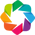

In [35]:
import pandas as pd                                        # DataFrame-functionaliteit
import numpy as np                                         # Converteren van DataBunch

from sklearn import datasets                               # Bevat de Iris-dataset

import holoviews as hv

hv.extension('bokeh')


In [36]:
irisBunch = datasets.load_iris()


iris = pd.DataFrame(data= np.c_[irisBunch['data'], irisBunch['target']],
                     columns= irisBunch['feature_names'] + ['species'])

iris2 = iris.drop(['sepal length (cm)', 'sepal width (cm)'], axis=1)
iris2.head()


,petal length (cm),petal width (cm),species
0,1.4,0.2,0.0
1,1.4,0.2,0.0
2,1.3,0.2,0.0
3,1.5,0.2,0.0
4,1.4,0.2,0.0


In [37]:
vdims = [('petal length (cm)')]
ds = hv.Dataset(iris2, ['petal width (cm)', 'species'], vdims)

In [38]:
%%opts Scatter [width=500 height=500]

ds.to(hv.Scatter, 'petal width (cm)', 'petal length (cm)')

:HoloMap   [species]
   :Scatter   [petal width (cm)]   (petal length (cm))

Schuifje

The various Elements like Scatter and Image all accept two types of dimensions: key dimensions (i.e., indexing dimensions or independent variables), and value dimensions (resulting data or dependent variables). These attributes are named kdims and vdims, respectively, and can be passed as the second and third positional argument for all Elements other than Histogram. As you can see above, 

https://holoviews.org/getting_started/Introduction.html

In [39]:
Bar chart met opties om vakken te kiezen?

http://holoviews.org/user_guide/Dashboards.html



SyntaxError: invalid syntax (3420161856.py, line 3)

<a id="seaborn"></a>
## Seaborn

In [ ]:
import numpy as np

X = np.linspace(-np.pi, np.pi, 256, endpoint=True)
C,S = np.cos(X), np.sin(X)

In [40]:
import matplotlib.pyplot as plt

plt.plot(X,C)
plt.plot(X,S)

plt.show()

NameError: name 'X' is not defined

In [41]:
plt.style.use('seaborn-whitegrid')

# Create a new figure of size 8x6 points, using 100 dots per inch
plt.figure(figsize=(8,6), dpi=80)

grid = plt.GridSpec(2,3,wspace=0.4,hspace=0.3)

# Create a new subplot from a grid of 1x1
plt.subplot(grid[0,0])

X = np.linspace(-np.pi, np.pi, 20, endpoint=True)
C,S = np.cos(X), np.sin(X)

# Plot cosine using blue color with a continuous line of width 1 (pixels)
plt.plot(X, C, '->', color="pink", linewidth=1.0)

plt.subplot(grid[0,1])

# Plot sine using green color with a continuous line of width 1 (pixels)
plt.plot(X, S, 'o', color="green", linewidth=1.0, linestyle="-")

# Set x limits
plt.xlim(-4.0,4.0)
plt.axis('equal')

# Set x ticks
plt.xticks(np.linspace(-4,4,3), ('Hoi','Dag'))

# Set y limits
#plt.ylim(-1.0,1.0)

# Set y ticks
plt.yticks(np.linspace(-1,1,5,endpoint=True))

# Save figure using 72 dots per inch
# savefig("../figures/exercice_2.png",dpi=72)


p = -2 * np.pi * np.random.random_sample((10)) + np.pi
q = -2 * np.random.random_sample((10)) + 1
sizes = np.linspace(100,1000,10)

plt.scatter(p,q,marker='o',s=sizes, c=sizes)
plt.colorbar()

plt.subplot(grid[0,2])

yerr = 0.5
Cerror = np.cos(X) + yerr*np.random.randn(20)

plt.errorbar(X,Cerror,yerr=yerr,fmt='.k')

plt.subplot(grid[1,:])

data1 = np.random.randn(10000)
data2 = np.random.randn(10000)*2
data3 = np.random.randn(10000)+2

kwargs = dict(histtype='stepfilled', alpha=0.3, normed=True, bins=50)

plt.hist(data1, **kwargs, label='Basis')
plt.hist(data2, **kwargs, label='Dubbel')
plt.hist(data3, **kwargs, label='Opgehoogd')

plt.legend()

print(np.histogram(data1, bins=5))

# Show result on screen
plt.show()


OSError: 'seaborn-whitegrid' is not a valid package style, path of style file, URL of style file, or library style name (library styles are listed in `style.available`)

NameError: name 'X' is not defined

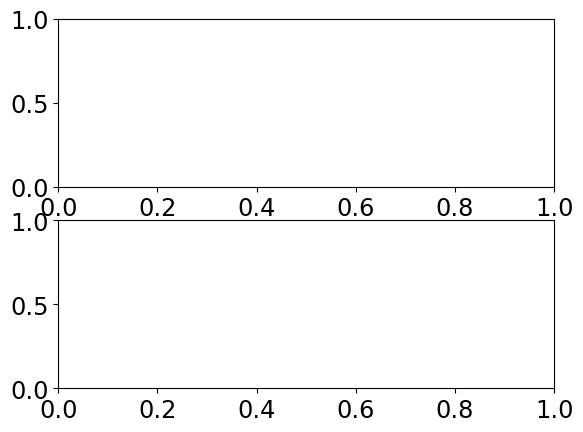

In [42]:
fig, ax = plt.subplots(2)
ax[0].plot(X,C)
ax[1].plot(X,S)
ax[0].text(0,1.1, "Top o' the sinus", size=10, color='gray')
plt.show()

C:\Users\aofie\AppData\Local\Temp\ipykernel_168128\3506161829.py:8: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(data[col])
C:\Users\aofie\AppData\Local\Temp\ipykernel_168128\3506161829.py:8: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(data[col])


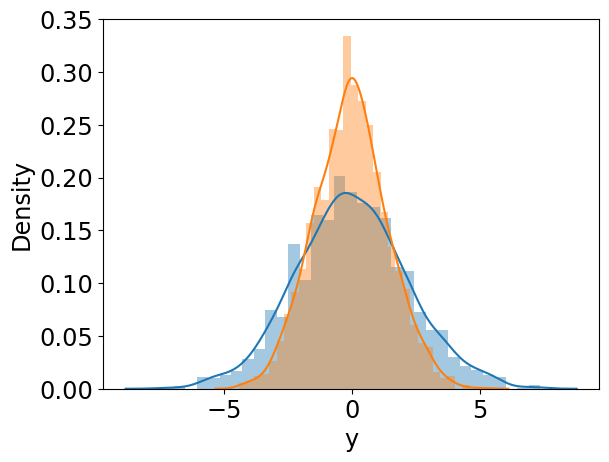

In [43]:
import pandas as pd
import seaborn as sns

data = np.random.multivariate_normal([0,0], [[5,2],[2,2]], size=2000)
data = pd.DataFrame(data,columns=['x','y'])

for col in 'xy':
    sns.distplot(data[col])
    
plt.ylim(.0,.35)
    
plt.show()

In [ ]:
sns.kdeplot(data['x'], data['y'])
plt.show()